In [1]:
import warnings
warnings.filterwarnings("ignore")
import sys


In [2]:
import pandas as pd
import scanpy as sc
import numpy as np
import anndata as ad
import torch
import torch.nn as nn
import torch.nn.functional as F
from model import DUSTED, DCA_ZINB
import squidpy as sq
import os
import matplotlib.pyplot as plt
from trainer import train_GAE,train_DCA
import scipy.sparse as sp
from torch_geometric.datasets import Planetoid
import torch_geometric.transforms as T
from STAGATE_pyG.utils import Transfer_pytorch_Data, mclust_R
from tqdm import tqdm
from loss import NB_loss,ZINB_loss
import STAGATE_pyG as STAGATE
from STAGATE_pyG.Train_STAGATE import train_STAGATE
import STAGATE_pyG as STAGATE
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.metrics import normalized_mutual_info_score, homogeneity_score
import magic

In [3]:
section_id = '151673'
input_dir = os.path.join('/data/DLPFC', section_id)
adata = sc.read_visium(path=input_dir, count_file=section_id+'_filtered_feature_bc_matrix.h5')
adata.var_names_make_unique()
sc.pp.calculate_qc_metrics(adata, inplace=True)
adata = adata[:,adata.var['total_counts']>100]

In [4]:
adata

View of AnnData object with n_obs × n_vars = 3639 × 11353
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'spatial'
    obsm: 'spatial'

In [5]:
sc.pp.highly_variable_genes(adata,n_top_genes=3000,flavor="seurat_v3")
hvg = list(adata[:,adata.var['highly_variable']].var_names)
select_genes = list(set(hvg))
adata = adata[:,select_genes]
scale_factor = adata.obs.total_counts/np.median(adata.obs.total_counts)
adata.obs['scale_factor'] = scale_factor
adata.raw = adata.copy()
sc.pp.normalize_total(adata,target_sum=1e4)
sc.pp.log1p(adata)

In [6]:
from openpyxl import load_workbook

workbook = load_workbook('/data/DLPFC/41593_2020_787_MOESM3_ESM.xlsx')

sheet = workbook.active

column_data = [cell.value for cell in sheet['E'] if cell.value is not None]
column_data = column_data[1:]
#print(column_data)


In [7]:
gene_names = ['CTGF', 'RELN', 'CARTPT', 'C1QL2', 'RORB', 'NEFH']
gene_indices=[]
for gene_name in column_data:
    if gene_name in adata.var_names:
        #gene_index = list(adata.var_names)
        gene_indices.append(gene_name) 
print(gene_indices)
print(len(gene_indices))

['CTGF', 'LMO4', 'ETV1', 'PCP4', 'CXCL14', 'NTNG2', 'NR4A2', 'CUX2', 'RELN', 'CALB1', 'B3GALT2', 'CBLN2', 'RXFP1', 'CDH24', 'GABRA5', 'CARTPT', 'RPRM', 'CACNA1E', 'FEZF2', 'PDE1A', 'VAT1L', 'C1QL2', 'MEF2C', 'ETV1', 'SEMA3E', 'TRIB2', 'KCNIP2', 'SLITRK1', 'SCN3B', 'SYNPR', 'CCK', 'FAM3C', 'FXYD6', 'RASGRF2', 'DKK3', 'RORB', 'GPR6', 'TOX', 'BEND5', 'ATP2B4', 'CNR1', 'PCP4', 'TLE4', 'TLE4', 'PENK', 'BCL11B', 'SATB2', 'FOXP2', 'TBR1', 'CRYM', 'KCNA1', 'SNCG', 'SYT17', 'CARTPT', 'MFGE8', 'ADRA2A', 'AKR1C2', 'MARCKSL1', 'CYR61', 'NEFH', 'LGALS1', 'SCN4B', 'SYT2', 'OPN3', 'KCNIP2', 'SOX5', 'SV2C', 'TPBG', 'IGSF11', 'LDB2', 'CNTN6', 'CRYM']
72


In [8]:
adata.layers['Raw'] = adata.X

In [9]:
from smoother import SpatialWeightMatrix, SpatialLoss
from smoother.models.impute import ImputeTorch

sparse_data = sp.csr_matrix(adata.X)
y = torch.Tensor(sparse_data.T.toarray()).float()
coords = adata.obsm['spatial']

weights = SpatialWeightMatrix()
weights.calc_weights_knn(coords, k=6)

# scale the spatial weight matrix by transcriptional similarity
weights.scale_by_expr(y)

# convert spatial weight into loss
spatial_loss = SpatialLoss('icar', weights, rho=0.99, standardize_cov=True)

# run imputation
m = ImputeTorch(y.T, spatial_loss, fixed_obs = True, nonneg=True, lambda_spatial_loss = 1,
                lr = 1e-2,  max_epochs = 200, verbose = True)
y_imp = m.get_results()

Number of spots: 3639. Average number of neighbors per spot:  5.85.
Number of spots: 3639. Average number of neighbors per spot:  5.86.


In [10]:
adata.layers['Smoother']=y_imp.detach().numpy()
sc.pp.normalize_total(adata, target_sum=1e4, layer="Smoother")
sc.pp.log1p(adata, layer="Smoother")

------Calculating spatial graph...
The graph contains 21124 edges, 3639 cells.
5.8049 neighbors per cell on average.


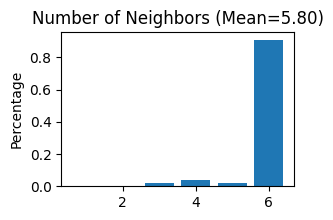

In [11]:
STAGATE.Cal_Spatial_Net(adata, rad_cutoff=150)
STAGATE.Stats_Spatial_Net(adata)

Size of Input:  (3639, 3000)


100%|██████████| 500/500 [00:05<00:00, 96.87it/s]


min_loss: 0.6350716948509216


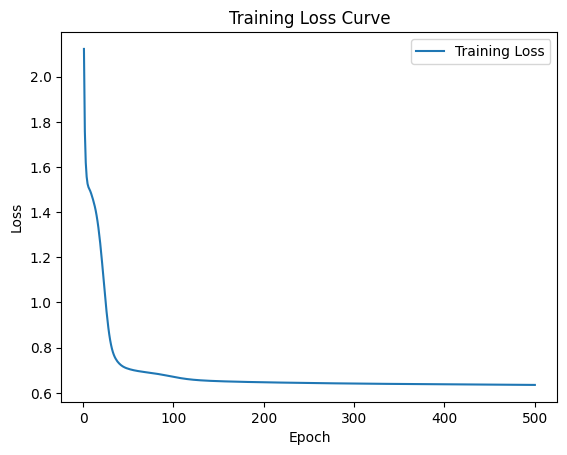

True
mse
torch.Size([3639, 3000])


In [12]:
from STAGATE_pyG import STAGATE

model = STAGATE([adata.X.shape[1], 512,30])
adata = train_GAE(adata, model, save_reconstrction=True,key_added = 'STAGATE')

In [13]:
magic_operator = magic.MAGIC()

X_magic = magic_operator.fit_transform(adata.X)
adata.layers['MAGIC']=X_magic
sc.pp.normalize_total(adata,layer='MAGIC',target_sum=1e4)
sc.pp.log1p(adata,layer='MAGIC')

Calculating MAGIC...
  Running MAGIC on 3639 cells and 3000 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 1.05 seconds.
    Calculating KNN search...
    Calculated KNN search in 1.90 seconds.
    Calculating affinities...
    Calculated affinities in 1.88 seconds.
  Calculated graph and diffusion operator in 4.83 seconds.
  Calculating imputation...
  Calculated imputation in 0.81 seconds.
Calculated MAGIC in 5.68 seconds.


Training finished.


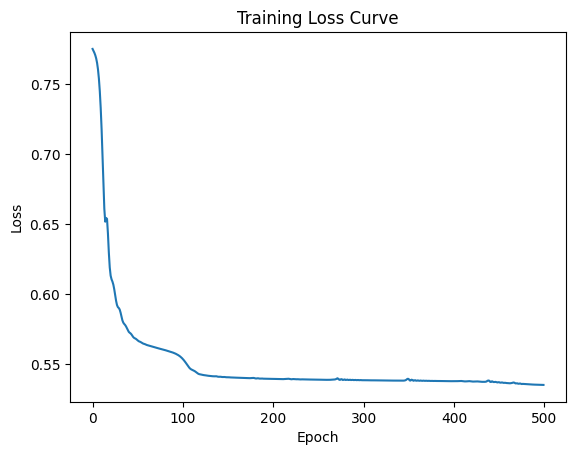

In [14]:
#DCA_ZINB

# transform scipy.sparse.csr_matrix to torch.Tensor
sparse_data = sp.csr_matrix(adata.X)
input_data = torch.Tensor(sparse_data.toarray())
scale_factor = torch.Tensor(adata.obs['scale_factor'])
raw_sparse_data = sp.csr_matrix(adata.raw.X)
raw_data = torch.Tensor(raw_sparse_data.toarray())

n_input = adata.X.shape[1]
model = DCA_ZINB(n_input,32,256,128,64,64,128,256)
loss_fn = 'ZINB_loss()'
optimizer = torch.optim.Adam(model.parameters(), lr=0.0005)
num_epochs = 500

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
use_cuda=torch.cuda.is_available()
if use_cuda:
     model = model.to(device=device)

trained_DCA_NB = train_DCA(model, input_data, raw_data, loss_fn, optimizer, num_epochs, device,scale_factor)

model.eval()
output_DCA_ZINB = model(input_data.to(device),scale_factor.to(device))
output_DCA_ZINB = output_DCA_ZINB[4]
adata.layers["DCA"] = np.nan_to_num(output_DCA_ZINB.cpu().detach().numpy())
sc.pp.normalize_total(adata, target_sum=1e4, layer="DCA")
sc.pp.log1p(adata, layer="DCA")

Size of Input:  (3639, 3000)


100%|██████████| 500/500 [00:27<00:00, 18.39it/s]


min_loss: 1609.9658203125


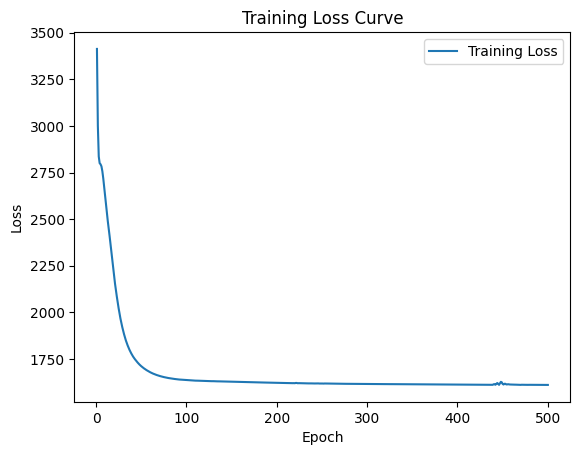

True
zinb


In [15]:
model = DUSTED([adata.X.shape[1], 512,30])
adata = train_GAE(adata, model, save_reconstrction=True, key_added='DUSTED', loss_mode='nb',lr=0.0001,n_epochs=500)
sc.pp.normalize_total(adata,layer='DUSTED',target_sum=1e4)
sc.pp.log1p(adata,layer='DUSTED')

Mean Moran's I Index for 0th dataset: 0.09154719991269215
Mean Moran's I Index for 1th dataset: 0.0848690818988864
Mean Moran's I Index for 2th dataset: 0.9500540147292867
Mean Moran's I Index for 3th dataset: 0.7683543899007682
Mean Moran's I Index for 4th dataset: 0.8127128913348779
Mean Moran's I Index for 5th dataset: 0.9796776760695894


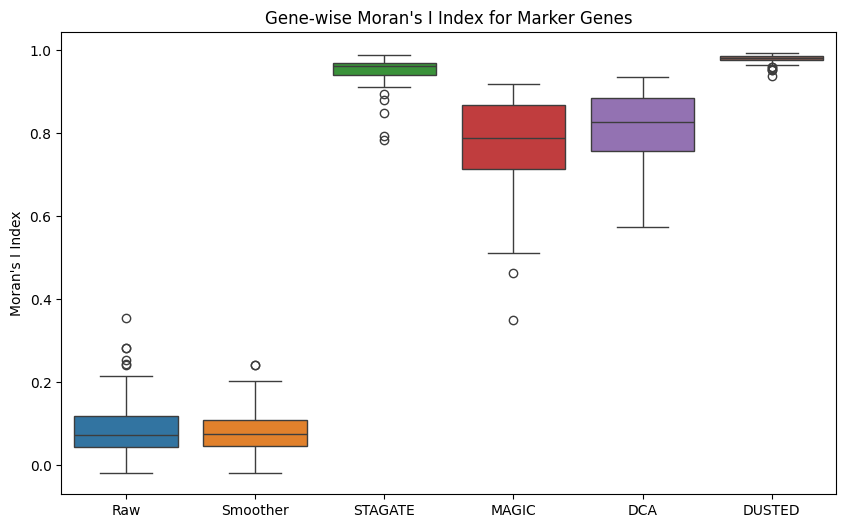

In [18]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from openpyxl import load_workbook

def plot_moran_index_specific_genes(adata, gene_list, section_id):
    all_moran_data = []
    layer_names = []
    
    #output_file = os.path.join('/data/DLPFC', section_id+'_results.xlsx')
    
    for layer_key in adata.layers.keys():
        moran_index_list = []
        sq.gr.spatial_autocorr(adata, mode="moran", layer=layer_key, genes=gene_list)
        moran_index_list = adata.uns["moranI"]["I"].tolist()
        all_moran_data.append(moran_index_list)
        layer_names.append(layer_key)


    df = pd.DataFrame(all_moran_data, index=layer_names).T
    #df.to_excel(output_file, index=False)
    
    x_ticks = np.arange(0, len(adata.layers.keys()), step=1)
    x_labels = list(adata.layers.keys())
    #x_labels.insert(0, 'Raw')
    plt.figure(figsize=(10,6))
    sns.boxplot(data=all_moran_data, notch=False)
    plt.xticks(x_ticks, x_labels,)
    plt.ylabel("Moran's I Index")
    plt.title('Gene-wise Moran\'s I Index for Marker Genes')
    

    for idx, data in enumerate(all_moran_data):
        mean_value = np.mean(data)
        print(f"Mean Moran's I Index for {idx}th dataset: {mean_value}")
    
    plt.show()

sq.gr.spatial_neighbors(adata)
plot_moran_index_specific_genes(adata, gene_indices, section_id)


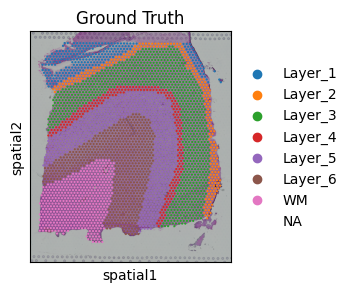

In [19]:
# read the annotation
Ann_df = pd.read_csv(os.path.join(input_dir, section_id+'_truth.txt'), sep='\t', header=None, index_col=0)
Ann_df.columns = ['Ground Truth']
adata.obs['Ground Truth'] = Ann_df.loc[adata.obs_names, 'Ground Truth']
adata = adata[adata.obs['Ground Truth']!='nan',]
plt.rcParams["figure.figsize"] = (3, 3)

sc.pl.spatial(adata, img_key="hires", color=["Ground Truth"])

[<Axes: title={'center': 'DUSTED_RELN'}, xlabel='spatial1', ylabel='spatial2'>]

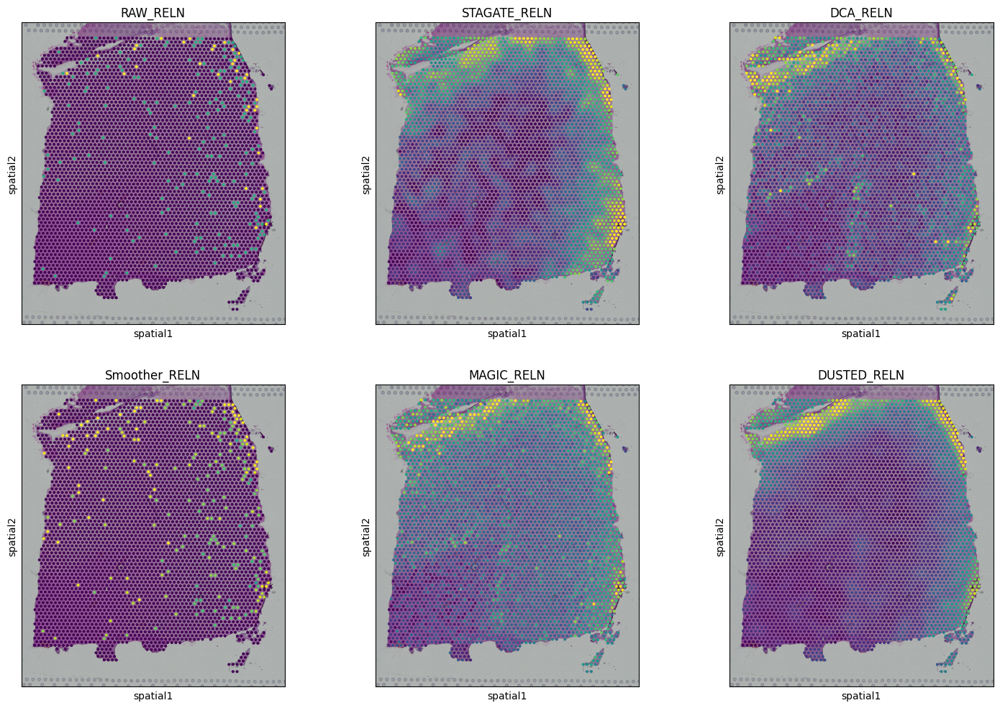

In [20]:
#layer1

plot_gene = 'RELN'
fig, axs = plt.subplots(2, 3, figsize=(18, 12))

sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[0,0], title='RAW_'+plot_gene, vmax='p99',colorbar_loc=None)
sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[0,1], title='STAGATE_'+plot_gene, layer='STAGATE', vmax='p99',colorbar_loc=None)
sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[0,2], title='DCA_'+plot_gene, layer="DCA", vmax='p99',colorbar_loc=None)
sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[1,0], title='Smoother_'+plot_gene, layer="Smoother", vmax='p99',colorbar_loc=None)
sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[1,1], title='MAGIC_'+plot_gene, layer="MAGIC", vmax='p99',colorbar_loc=None)
sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[1,2], title='DUSTED_'+plot_gene, layer="DUSTED", vmax='p99',colorbar_loc=None)

[<Axes: title={'center': 'DUSTED_C1QL2'}, xlabel='spatial1', ylabel='spatial2'>]

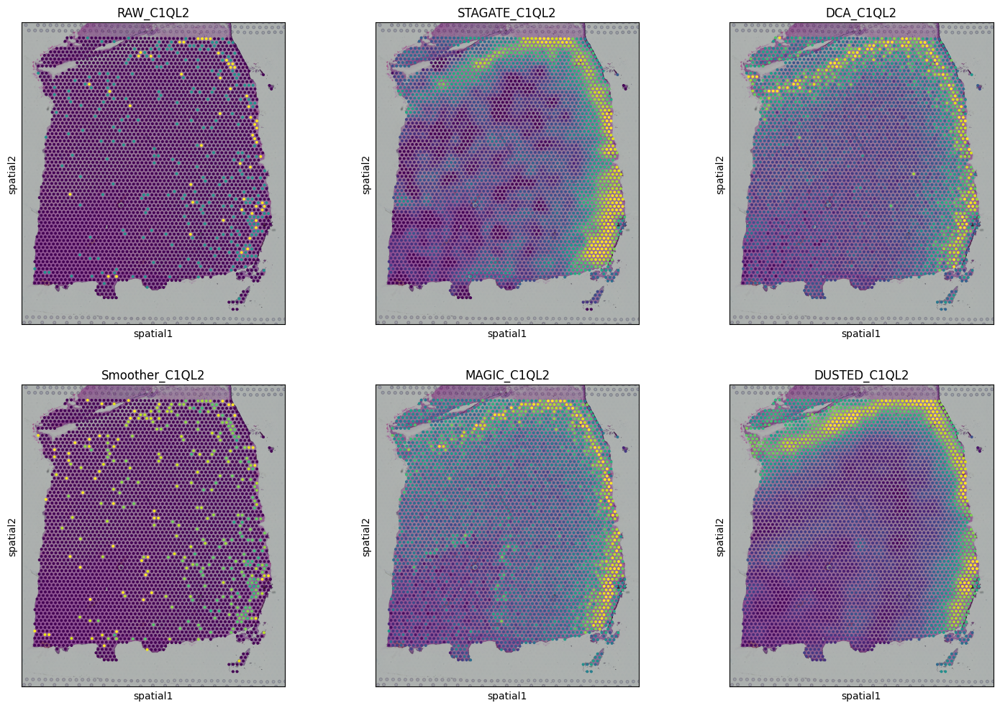

In [21]:
#layer2
plot_gene = 'C1QL2'
fig, axs = plt.subplots(2, 3, figsize=(18, 12))

sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[0,0], title='RAW_'+plot_gene, vmax='p99',colorbar_loc=None)
sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[0,1], title='STAGATE_'+plot_gene, layer='STAGATE', vmax='p99',colorbar_loc=None)
sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[0,2], title='DCA_'+plot_gene, layer="DCA", vmax='p99',colorbar_loc=None)
sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[1,0], title='Smoother_'+plot_gene, layer="Smoother", vmax='p99',colorbar_loc=None)
sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[1,1], title='MAGIC_'+plot_gene, layer="MAGIC", vmax='p99',colorbar_loc=None)
sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[1,2], title='DUSTED_'+plot_gene, layer="DUSTED", vmax='p99',colorbar_loc=None)

[<Axes: title={'center': 'DUSTED_CARTPT'}, xlabel='spatial1', ylabel='spatial2'>]

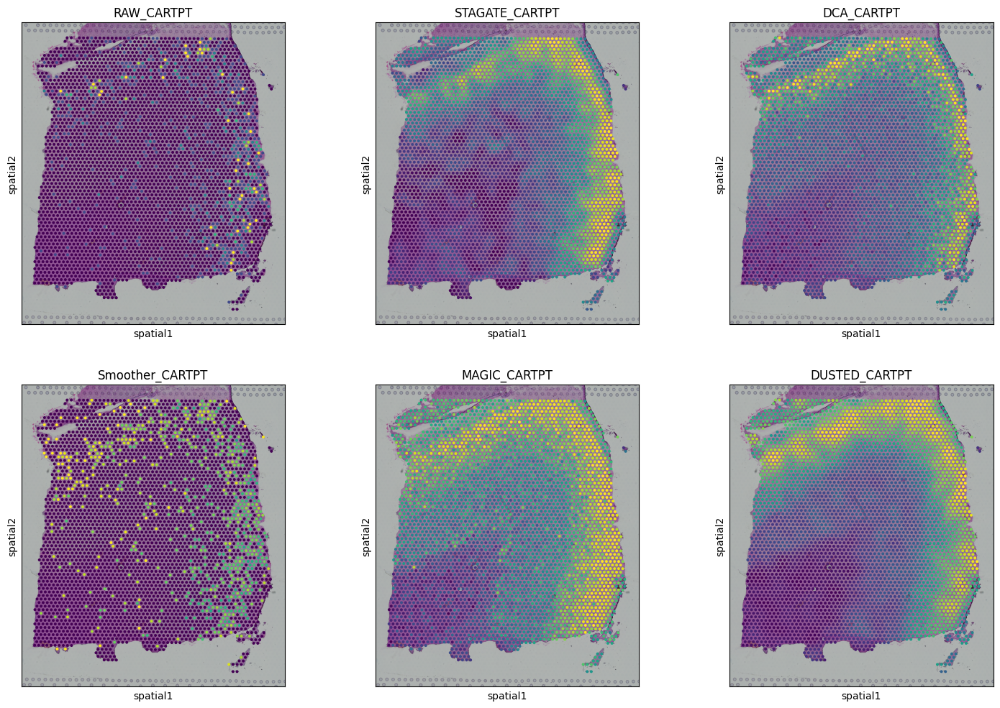

In [22]:
#layer3
plot_gene = 'CARTPT'
fig, axs = plt.subplots(2, 3, figsize=(18, 12))

sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[0,0], title='RAW_'+plot_gene, vmax='p99',colorbar_loc=None)
sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[0,1], title='STAGATE_'+plot_gene, layer='STAGATE', vmax='p99',colorbar_loc=None)
sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[0,2], title='DCA_'+plot_gene, layer="DCA", vmax='p99',colorbar_loc=None)
sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[1,0], title='Smoother_'+plot_gene, layer="Smoother", vmax='p99',colorbar_loc=None)
sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[1,1], title='MAGIC_'+plot_gene, layer="MAGIC", vmax='p99',colorbar_loc=None)
sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[1,2], title='DUSTED_'+plot_gene, layer="DUSTED", vmax='p99',colorbar_loc=None)

[<Axes: title={'center': 'DUSTED_RORB'}, xlabel='spatial1', ylabel='spatial2'>]

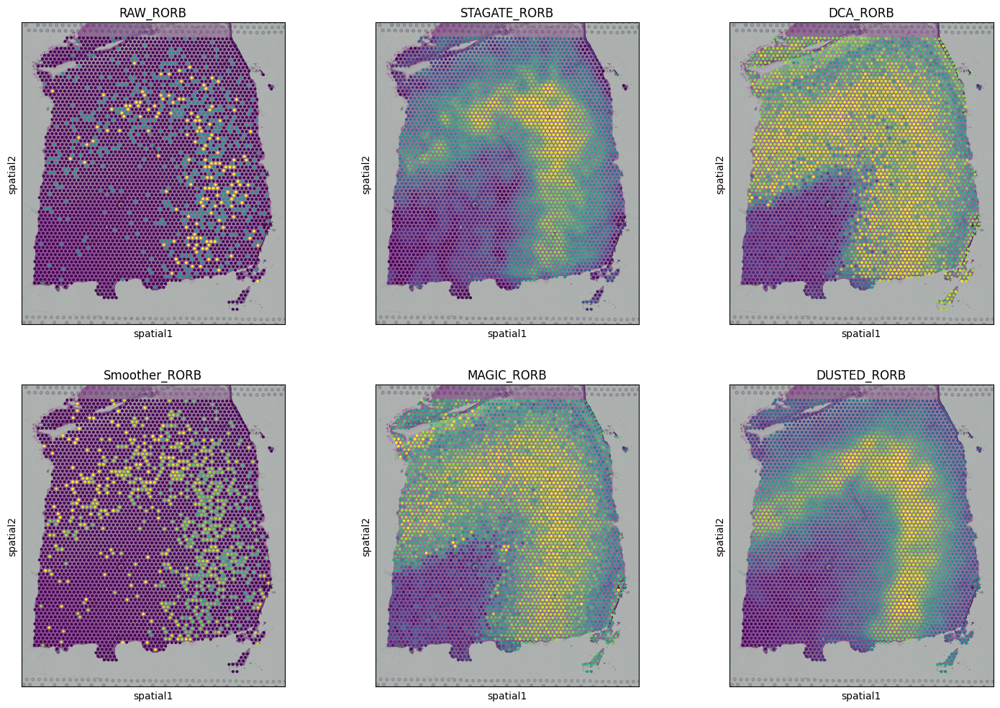

In [23]:
#layer4
plot_gene = 'RORB'
fig, axs = plt.subplots(2, 3, figsize=(18, 12))

sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[0,0], title='RAW_'+plot_gene, vmax='p99',colorbar_loc=None)
sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[0,1], title='STAGATE_'+plot_gene, layer='STAGATE', vmax='p99',colorbar_loc=None)
sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[0,2], title='DCA_'+plot_gene, layer="DCA", vmax='p99',colorbar_loc=None)
sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[1,0], title='Smoother_'+plot_gene, layer="Smoother", vmax='p99',colorbar_loc=None)
sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[1,1], title='MAGIC_'+plot_gene, layer="MAGIC", vmax='p99',colorbar_loc=None)
sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[1,2], title='DUSTED_'+plot_gene, layer="DUSTED", vmax='p99',colorbar_loc=None)

[<Axes: title={'center': 'DUSTED_NEFH'}, xlabel='spatial1', ylabel='spatial2'>]

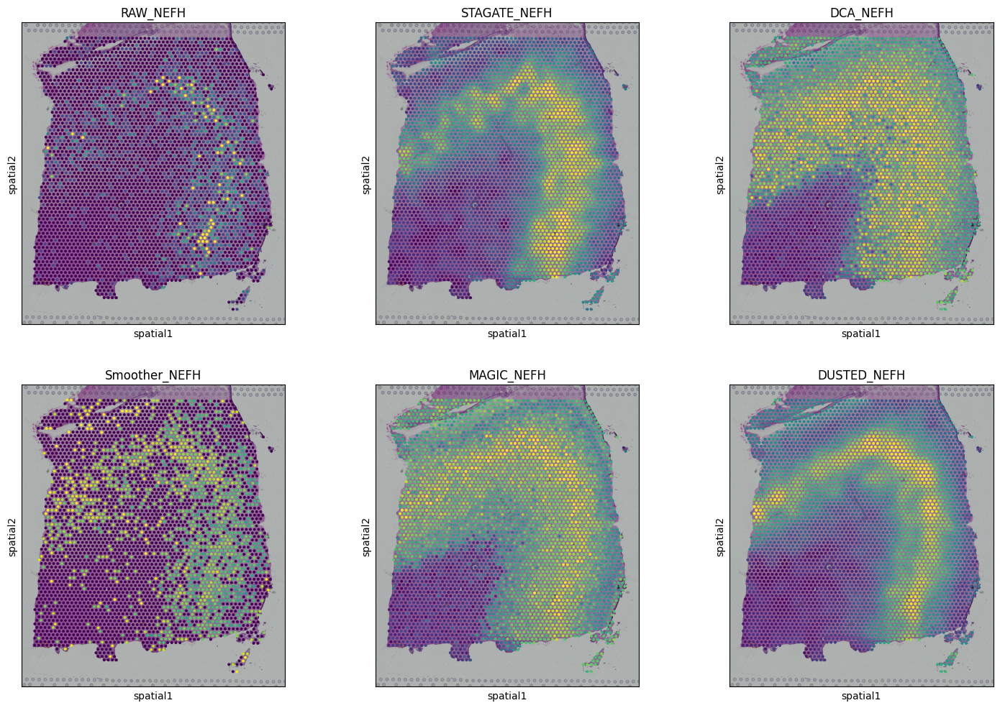

In [24]:
#layer5
plot_gene = 'NEFH'
fig, axs = plt.subplots(2, 3, figsize=(18, 12))

sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[0,0], title='RAW_'+plot_gene, vmax='p99',colorbar_loc=None)
sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[0,1], title='STAGATE_'+plot_gene, layer='STAGATE', vmax='p99',colorbar_loc=None)
sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[0,2], title='DCA_'+plot_gene, layer="DCA", vmax='p99',colorbar_loc=None)
sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[1,0], title='Smoother_'+plot_gene, layer="Smoother", vmax='p99',colorbar_loc=None)
sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[1,1], title='MAGIC_'+plot_gene, layer="MAGIC", vmax='p99',colorbar_loc=None)
sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[1,2], title='DUSTED_'+plot_gene, layer="DUSTED", vmax='p99',colorbar_loc=None)

[<Axes: title={'center': 'DUSTED_CTGF'}, xlabel='spatial1', ylabel='spatial2'>]

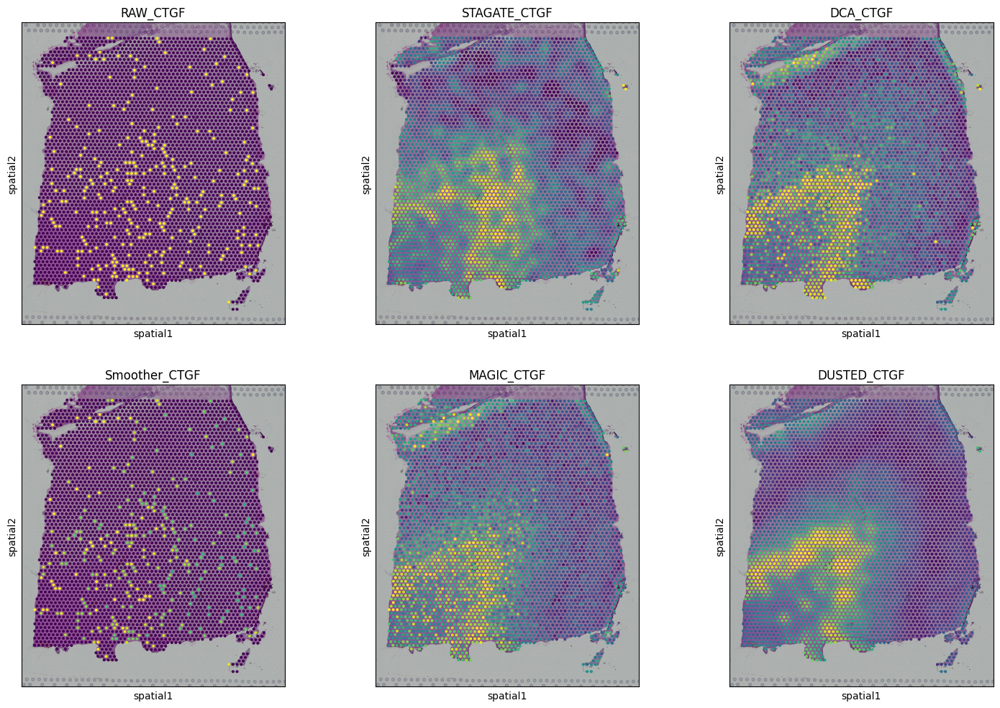

In [25]:
#layer6+WM
plot_gene = 'CTGF'
fig, axs = plt.subplots(2, 3, figsize=(18, 12))

sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[0,0], title='RAW_'+plot_gene, vmax='p99',colorbar_loc=None)
sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[0,1], title='STAGATE_'+plot_gene, layer='STAGATE', vmax='p99',colorbar_loc=None)
sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[0,2], title='DCA_'+plot_gene, layer="DCA", vmax='p99',colorbar_loc=None)
sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[1,0], title='Smoother_'+plot_gene, layer="Smoother", vmax='p99',colorbar_loc=None)
sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[1,1], title='MAGIC_'+plot_gene, layer="MAGIC", vmax='p99',colorbar_loc=None)
sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[1,2], title='DUSTED_'+plot_gene, layer="DUSTED", vmax='p99',colorbar_loc=None)